 # UAVSAR time sereis ampltidue of different land types
 ## 1) generate amplitude image of each study site and show selected AOIs on the amplitude image
 ##  2) Calculate and display the time series of mean amplitude of selected AOIs
 ### Heming Liao, hliao@alaska.edu

In [16]:
import os
import glob
import matplotlib.pyplot as plt
import numpy as np
from scipy import ndimage
from datetime import datetime
from matplotlib.dates import DateFormatter

In [69]:
# time series of amplitude images for different land covers

site_list = ('NISARA_06800','winnip_31606','SanAnd_05508','SDelta_23518')

SLC_data_dir = '/Users/hliao/Documents/UAF_work/coherence/npy_new_data'
mask_dir = '/Users/hliao/Documents/UAF_work/coherence/AOI_mask_data'
output_dir1 = '/Users/hliao/Documents/UAF_work/coherence/npy_new_data_results/amp_figs'
output_dir2 = '/Users/hliao/Documents/UAF_work/coherence/npy_new_data_results/amp_TS'

polarizations = ['HH','HV','VH','VV']

site_temporal_coverage = {site_list[0]:('190606','190930'), site_list[1]:('120617','120717'),
                          site_list[2]:('090908','120924'), site_list[3]:('090908','120924')}

sites_land_type = {'NISARA':['NISARA_veg1','NISARA_veg2','NISARA_veg3','NISARA_veg4','NISARA_veg5',
                            'NISARA_veg6','NISARA_veg7','NISARA_veg8','NISARA_veg9','NISARA_veg10',],
                   'SDelta':['SDelta_agr1','SDelta_agr2','SDelta_agr3','SDelta_agr4','SDelta_agr5',
                            'SDelta_agr6','SDelta_agr7','SDelta_agr8','SDelta_agr9','SDelta_agr10',], 
                   'winnip':['winnip_agr1','winnip_agr2','winnip_agr3','winnip_agr4','winnip_agr5',
                            'winnip_agr6','winnip_agr7','winnip_agr8','winnip_agr9','winnip_agr10','winnip_agr11',],
                   'SanAnd':['SanAnd_bareland1','SanAnd_bareland2','SanAnd_bareland3','SanAnd_bareland4','SanAnd_bareland5',
                            'SanAnd_bareland6','SanAnd_bareland7','SanAnd_bareland8','SanAnd_bareland9','SanAnd_bareland10']}

for site in site_list:
    
    print('Processing site: ' + site.split("_")[0] + '\n' + 'Acquisition dates: ')
    
    index = site_list.index(site)
    
    # acquisitions' date list for UAVSAR site: site
    temp = [fileName.split('/')[7].split('_')[1]
            for fileName in glob.glob(os.path.join(SLC_data_dir,site.split('_')[0]+'*.npy'))]
    acq_dates = sorted(temp)
    
    # selected UAVSAR acquisitions coverage from date1 to date2
    date1 = datetime.strptime(site_temporal_coverage[site][0],'%y%m%d')
    date2 = datetime.strptime(site_temporal_coverage[site][-1],'%y%m%d')
    
    # convert date str to decimal number
    acq_dates_dec_Num = [ datetime.timestamp(datetime.strptime(date_temp,'%y%m%d')) for date_temp in acq_dates]
    
    date_start = datetime.timestamp(date1)
    date_end = datetime.timestamp(date2)
    acq_dates_selected = [datetime.fromtimestamp(x).strftime('%y%m%d') for x in acq_dates_dec_Num if date_start <= x <= date_end]
    data_Num = len(acq_dates_selected)
    print(acq_dates_selected)
        
    ##  display/save the time series amplitude images
    vmin, vmax = 0,0
    for count,data in enumerate(acq_dates_selected):
        slc1 = np.load(os.path.join(SLC_data_dir, site.split('_')[0] + '_' + data + 
                                    '_rg6_azi16_ML_SLC.npy'))
        slc_Intensity = np.real(slc1[:,:,0]*np.conj(slc1[:,:,0]))
        slc_Intensity_filt = ndimage.median_filter(slc_Intensity,size=3)
        slc_amp_filt = 10*np.log10( slc_Intensity_filt)
        zero_index = (slc_Intensity==0)
        slc_amp_filt[zero_index] = 0 # set the -inf to zero. May need to change to np.nan
        
        if count == 0:
            vmin,vmax = min(slc_amp_filt.flatten()), max(slc_amp_filt.flatten())
        fig,axes = plt.subplots(figsize=(np.ceil(slc1.shape[1]/600),np.ceil(slc1.shape[0]/600)),dpi=300)
        img = axes.imshow(slc_amp_filt,cmap='gray',vmin=vmin, vmax=vmax)
        axes.axis('off')
        cbar=plt.colorbar(img,pad=0.01, fraction=0.019,orientation='horizontal')
        fig.suptitle(site.split('_')[0] + '-' + data)
        
        fig_out = os.path.join(output_dir1, site.split('_')[0] + '-' + data)
        fig.savefig(fig_out)
        plt.close()
    

Processing site: NISARA
Acquisition dates: 
['190606', '190620', '190701', '190725', '190812', '190923', '190930']


/Users/hliao/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:55: RuntimeWarning: divide by zero encountered in log10


Processing site: winnip
Acquisition dates: 
['120617', '120619', '120622', '120623', '120625', '120627', '120629', '120703', '120705', '120708', '120710', '120713', '120714', '120717']
Processing site: SanAnd
Acquisition dates: 
['090908', '091002', '091102', '091117', '091203', '100114', '100115', '100409', '100510', '100511', '100617', '100712', '100810', '100925', '101025', '101110', '101201', '110110', '110330', '110512', '110616', '110712', '110720', '110829', '111003', '111102', '111207', '120105', '120213', '120322', '120424', '120530', '120718', '120815', '120924']
Processing site: SDelta
Acquisition dates: 
['090908', '091002', '091102', '091203', '100114', '100303', '100409', '100510', '100617', '100712', '100810', '100925', '101025', '101130', '110110', '110330', '110512', '110616', '110720', '110829', '111003', '111102', '111207', '120105', '120213', '120322', '120424', '120530', '120718', '120815', '120924']


Processing site: NISARA
Acquisition dates: 
['190606', '190620', '190701', '190725', '190812', '190923', '190930']
Area of Interest: NISARA_veg1
Area of Interest: NISARA_veg2
Area of Interest: NISARA_veg3
Area of Interest: NISARA_veg4
Area of Interest: NISARA_veg5
Area of Interest: NISARA_veg6
Area of Interest: NISARA_veg7
Area of Interest: NISARA_veg8
Area of Interest: NISARA_veg9
Area of Interest: NISARA_veg10
NISARA_veg1_TS_amplitude
Processing site: winnip
Acquisition dates: 
['120617', '120619', '120622', '120623', '120625', '120627', '120629', '120703', '120705', '120708', '120710', '120713', '120714', '120717']
Area of Interest: winnip_agr1
Area of Interest: winnip_agr2
Area of Interest: winnip_agr3
Area of Interest: winnip_agr4
Area of Interest: winnip_agr5
Area of Interest: winnip_agr6
Area of Interest: winnip_agr7
Area of Interest: winnip_agr8
Area of Interest: winnip_agr9
Area of Interest: winnip_agr10
Area of Interest: winnip_agr11
winnip_agr1_TS_amplitude
Processing site: 

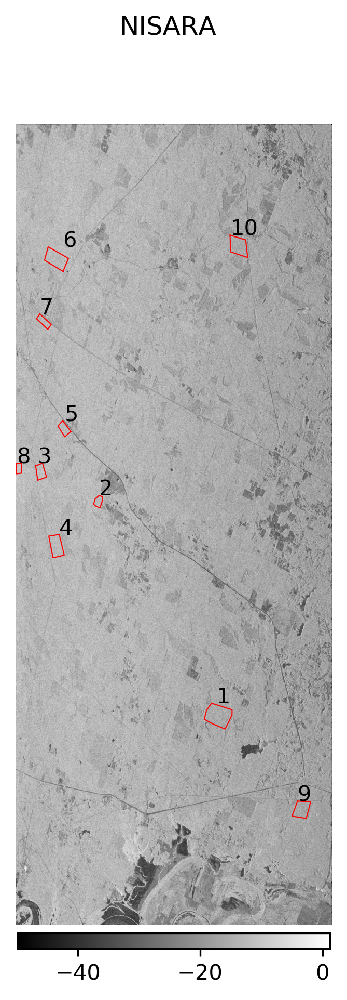

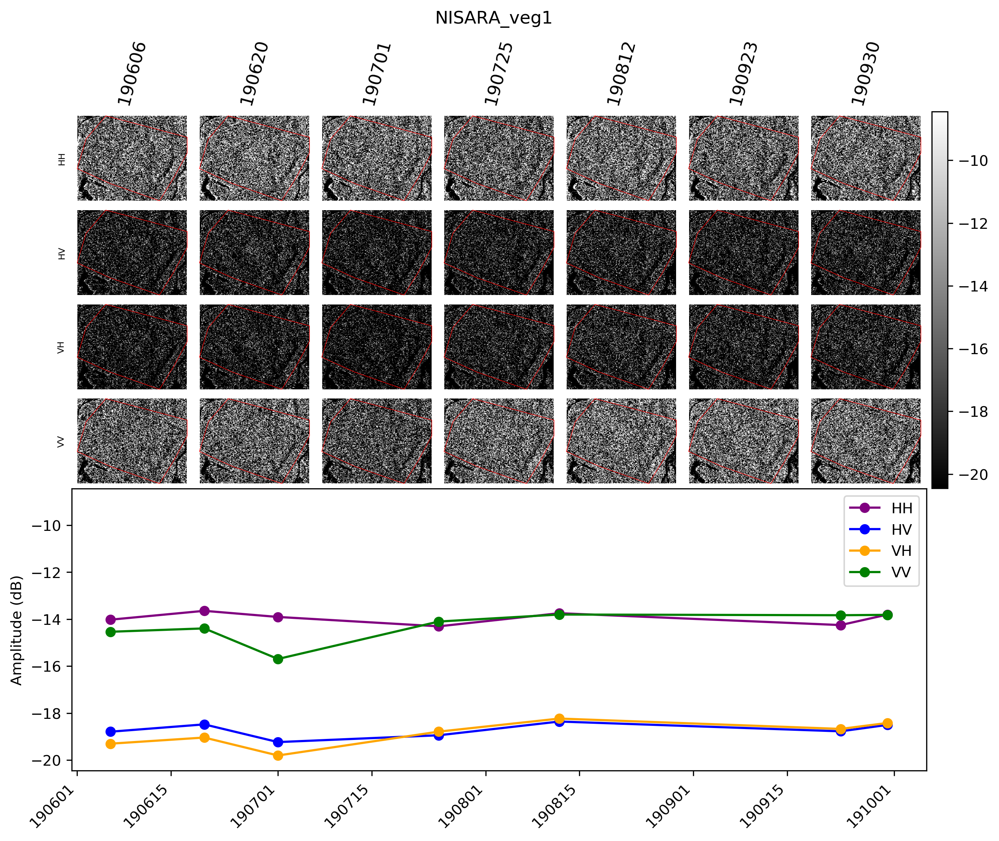

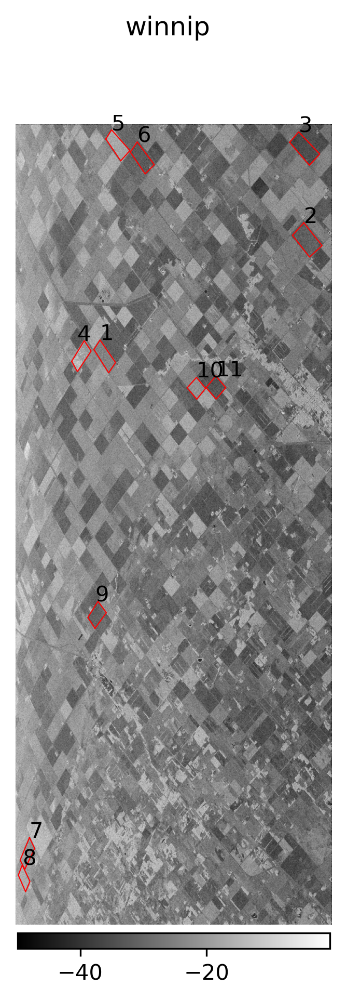

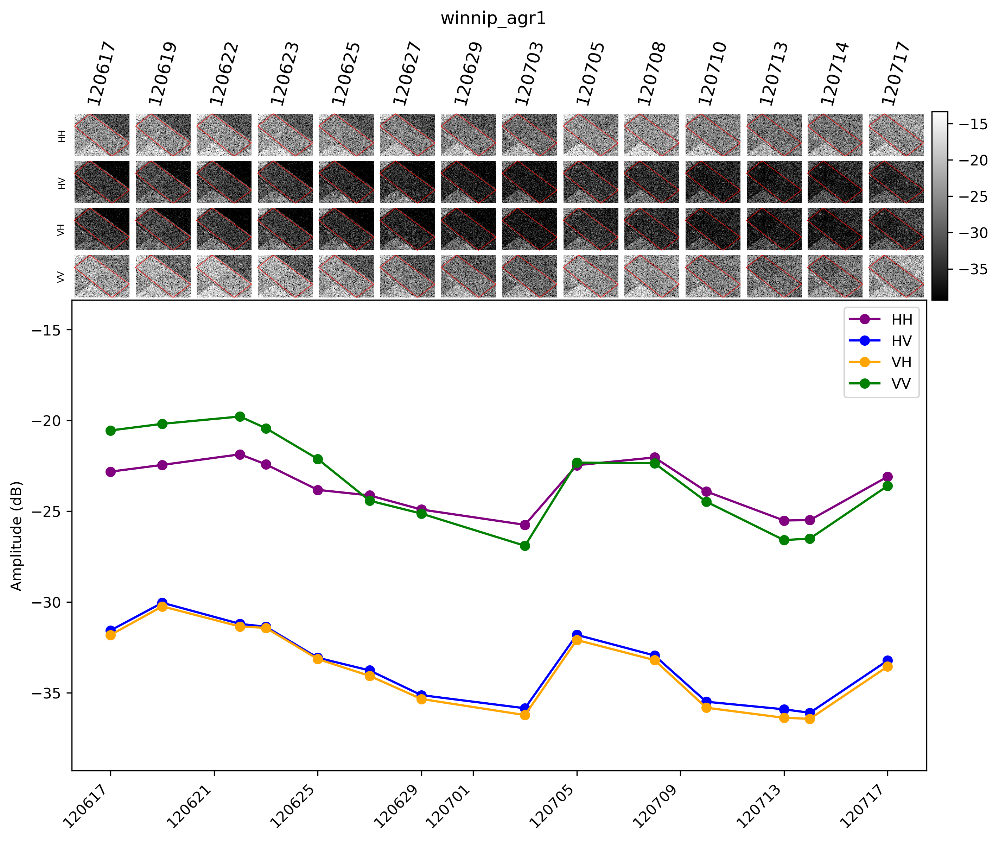

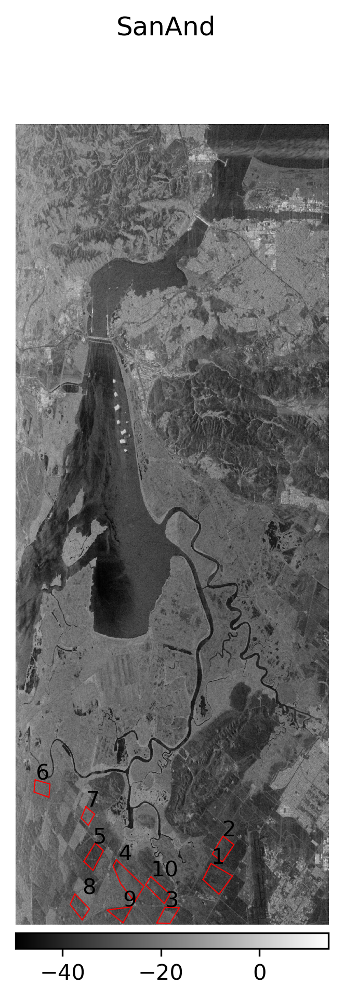

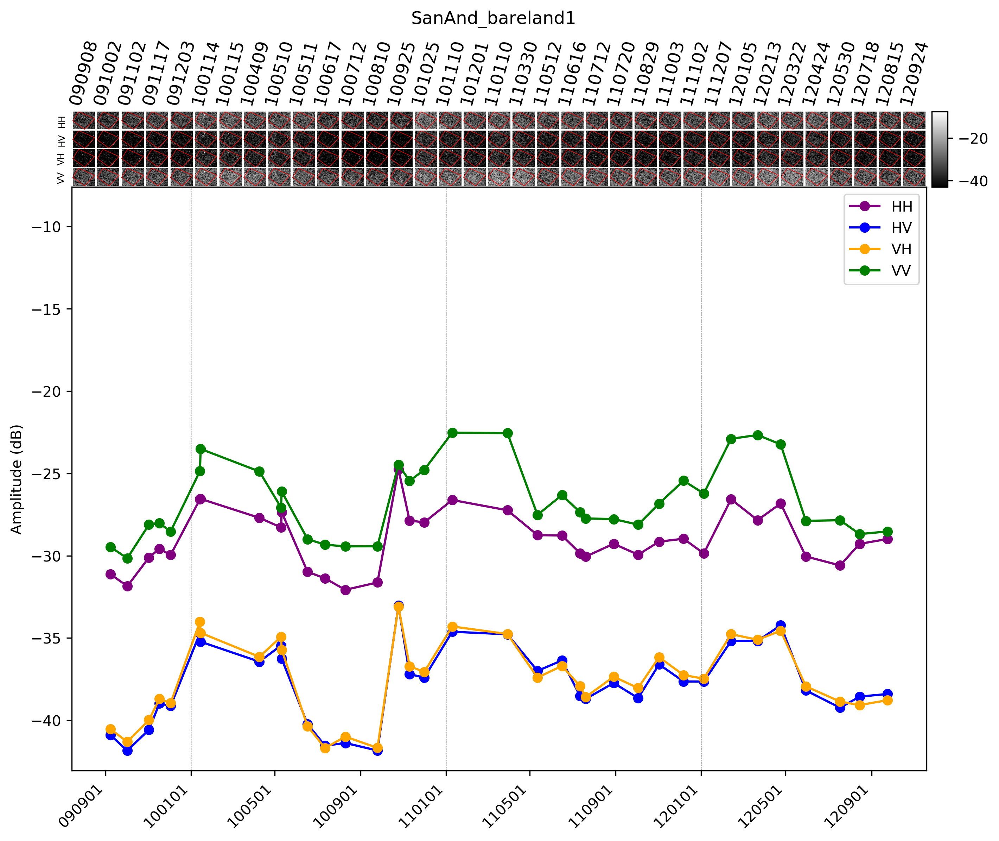

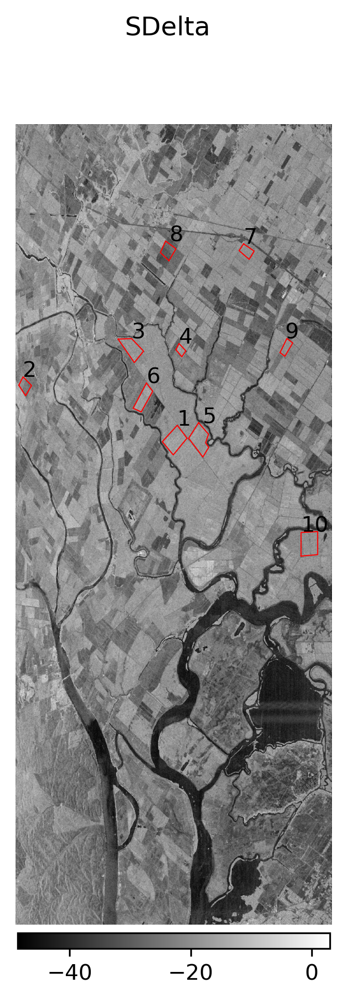

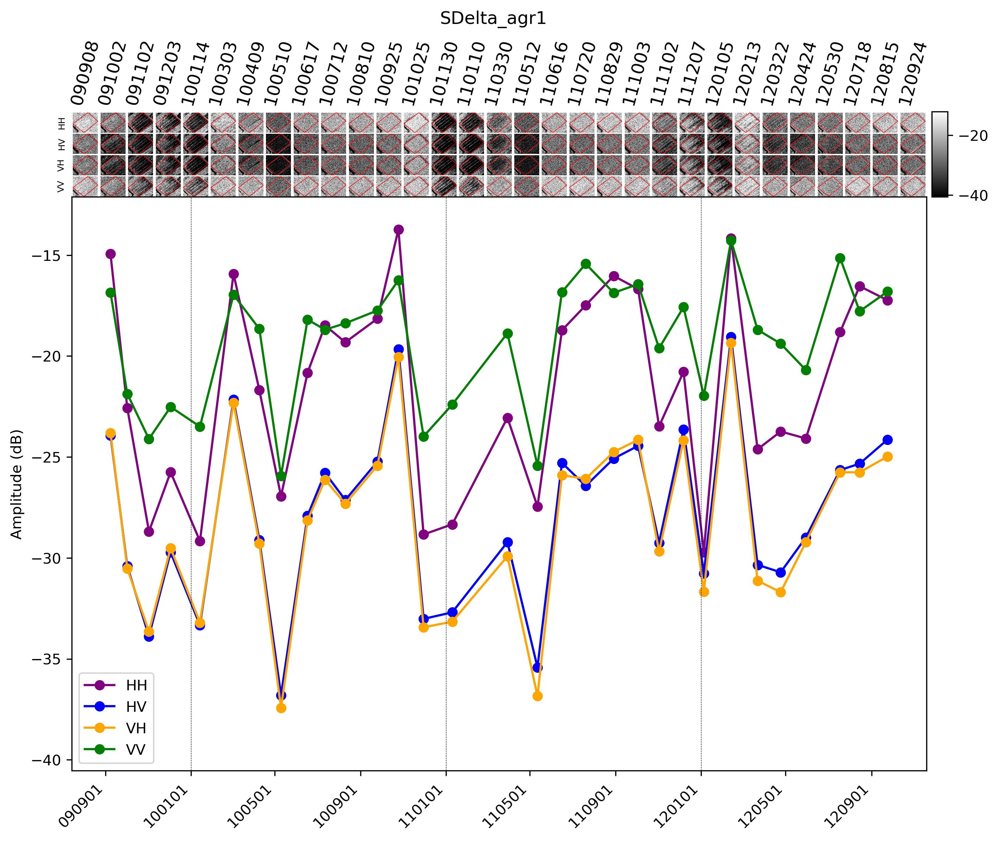

In [68]:
# time sereis AOIs and mean amplitude of these selected AOIs

for site in site_list:
    
    print('Processing site: ' + site.split("_")[0] + '\n' + 'Acquisition dates: ')
    
    index = site_list.index(site)
    
    # acquisitions' date list for UAVSAR site: site
    temp = [fileName.split('/')[7].split('_')[1]
            for fileName in glob.glob(os.path.join(SLC_data_dir,site.split('_')[0]+'*.npy'))]
    acq_dates = sorted(temp)
    
    # selected UAVSAR acquisitions coverage from date1 to date2
    date1 = datetime.strptime(site_temporal_coverage[site][0],'%y%m%d')
    date2 = datetime.strptime(site_temporal_coverage[site][-1],'%y%m%d')
    
    # convert date str to decimal number
    acq_dates_dec_Num = [ datetime.timestamp(datetime.strptime(date_temp,'%y%m%d')) for date_temp in acq_dates]
    
    date_start = datetime.timestamp(date1)
    date_end = datetime.timestamp(date2)
    acq_dates_selected = [datetime.fromtimestamp(x).strftime('%y%m%d') for x in acq_dates_dec_Num if date_start <= x <= date_end]
    data_Num = len(acq_dates_selected)
    print(acq_dates_selected)
    
    # load the land-cover mask
    land_cover_mask, land_cover_polygon_xx, land_cover_polygon_yy = [], [], []
    land_cover_Num = len(sites_land_type[site.split('_')[0]])
    for aoi in sites_land_type[site.split('_')[0]]:
        mask_file = os.path.join(mask_dir, aoi  + '_' + 'polygon_mask.npy')
        land_cover_mask.append( np.load(mask_file) )
            
        polygon_file = os.path.join(mask_dir, aoi + '_' + 'polygon_points.npy')
        land_cover_polygon = ( np.load(polygon_file) )
            
        land_cover_polygon_xx.append( land_cover_polygon[0,:] )
        land_cover_polygon_yy.append( land_cover_polygon[1,:] )
        
    ##  plot the area of interest (AOIs) on the amplitude images
    slc1 = np.load(os.path.join(SLC_data_dir, site.split('_')[0] + '_' + acq_dates_selected[0] + 
                                '_rg6_azi16_ML_SLC.npy'))
    slc_amplitude = 10*np.log10( np.real(slc1[:,:,0]*np.conj(slc1[:,:,0]))+ 0.00001)
    slc_amp_filt = ndimage.median_filter(slc_amplitude,size=5)
    fig,axes = plt.subplots(figsize=(np.ceil(slc1.shape[1]/600),np.ceil(slc1.shape[0]/600)),dpi=300)
    img = axes.imshow(slc_amp_filt,cmap='gray')
    axes.axis('off')
    cbar=plt.colorbar(img,pad=0.01, fraction=0.019,orientation='horizontal')
    fig.suptitle(site.split('_')[0])
    
    # plot the area of interest outline on the amplitude image
    for ii in range(land_cover_Num):
        axes.plot(land_cover_polygon_xx[ii],land_cover_polygon_yy[ii],'r-',LineWidth=0.5)
        plt.text(np.median(land_cover_polygon_xx[ii]),min(land_cover_polygon_yy[ii])-1,str(ii+1))
        
    fig_out = os.path.join(output_dir2, site.split('_')[0] + '_amplitude.png')
    fig.savefig(fig_out)
    

    ## for each area of interest, calculate its time series amplitude for each polarimetric channel
    amp_TS_AOIs = [ [] for x in range(land_cover_Num)]
    amp_TS = np.zeros((land_cover_Num,data_Num,len(polarizations))) # Nx4, 4 different channels
    
    for kk in range(land_cover_Num):
        print('Area of Interest: ' + sites_land_type[site.split('_')[0]][kk])
        dates_TS = []
        land_cover_yy,land_cover_xx = np.where(land_cover_mask[kk] == 1)
        yy_min, yy_max = int(np.floor(min(land_cover_yy))), int(np.ceil(max(land_cover_yy)))
        xx_min, xx_max = int(np.floor(min(land_cover_xx))), int(np.ceil(max(land_cover_xx)))
        for jj in range(len(acq_dates_selected)):
            dates_TS.append(datetime.strptime(acq_dates_selected[jj],'%y%m%d'))
                        
            slc1 = np.load(os.path.join(SLC_data_dir, site.split('_')[0] + '_' + acq_dates_selected[jj] + 
                                    '_rg6_azi16_ML_SLC.npy'))

            for ii in range(len(polarizations)):
                slc_Intensity = np.real(slc1[:,:,ii]*np.conj(slc1[:,:,ii]))
                zero_index = (slc_Intensity == 0)
                # amplitude
                slc_Intensity_aoi_rect = slc_Intensity[yy_min:yy_max+1,xx_min:xx_max+1]
                zero_index_aoi_rect = zero_index[yy_min:yy_max+1,xx_min:xx_max+1]
                slc_aoi_amp = 10*np.log10(slc_Intensity_aoi_rect)
                slc_aoi_amp[zero_index_aoi_rect] = 0 # set the -inf to zero
                amp_TS_AOIs[kk].append( slc_aoi_amp )
                # mean amplitude
                amp_TS[kk,jj,ii] = 10*np.log10( np.mean(slc_Intensity[land_cover_mask[kk]]))
    
    vmin, vmax = np.min(amp_TS[:,:,:]), np.max(amp_TS[:,:,:])
    for kk in range(land_cover_Num):
        land_cover_yy,land_cover_xx = np.where(land_cover_mask[kk] == 1)
        yy_min, yy_max = np.floor(min(land_cover_yy)), np.ceil(max(land_cover_yy))
        xx_min, xx_max = np.floor(min(land_cover_xx)), np.ceil(max(land_cover_xx))
        # plot the time series AOIs images
        fig = plt.figure(figsize=(10,8),dpi=300)
        gs = fig.add_gridspec(data_Num, data_Num)
        for ii in range(len(acq_dates_selected)):
            for count,jj in enumerate(polarizations):
                fig_ax1 = fig.add_subplot(gs[count,ii])
                img = fig_ax1.imshow( amp_TS_AOIs[kk][ii*len(polarizations) + count], cmap='gray', vmin=vmin, vmax=vmax )
                fig_ax1.plot(land_cover_polygon_xx[kk]-xx_min,land_cover_polygon_yy[kk]-yy_min,'r-',LineWidth=0.35)
                plt.setp(fig_ax1.spines.values(), visible=False)
                fig_ax1.set(xticks=[],xticklabels=[],yticks=[],yticklabels=[],aspect='auto')
                if (ii == 0):
                    fig_ax1.set_ylabel(jj,fontsize=6)
                    fig_ax1.yaxis.set_label_position("left")
                if (count == 0):
                    fig_ax1.set_title(acq_dates_selected[ii],rotation=75)
                if (count == len(polarizations)-1 and ii == (data_Num - 1)):
                    cax = fig.add_axes([0.915, 0.08+0.78*(data_Num-4)/(data_Num), 0.015, 0.78*4/(data_Num)])
                    fig.colorbar(img, cax=cax, orientation='vertical')
        
        # plot the scatter plot for each polarization
        fig_ax2 = fig.add_subplot(gs[4:,:])
        fig_ax2.plot(dates_TS,amp_TS[kk,:,0],'o-',color='purple') # HH
        fig_ax2.plot(dates_TS,amp_TS[kk,:,1],'bo-') # HV
        fig_ax2.plot(dates_TS,amp_TS[kk,:,2],'o-',color='orange') # VH
        fig_ax2.plot(dates_TS,amp_TS[kk,:,3],'go-') # VV
        fig_ax2.set_ylim(vmin,vmax)
        myFmt = DateFormatter("%y%m%d")
        fig_ax2.xaxis.set_major_formatter(myFmt)
        #plot the year separation
        year_range = range(dates_TS[0].year, dates_TS[-1].year)
        for yy in year_range:
            fig_ax2.plot([datetime.strptime(str(yy+1),'%Y'),datetime.strptime(str(yy+1),'%Y')],
                      [np.min(amp_TS[:,:,:]), np.max(amp_TS[:,:,:])],'k--',LineWidth=0.3)
        fig_ax2.set_ylabel('Amplitude (dB)')
        plt.setp(fig_ax2.get_xticklabels(),rotation=45,ha='right')
        fig_ax2.legend(['HH','HV','VH','VV'])
        fig.suptitle(sites_land_type[site.split('_')[0]][kk])
        fig.subplots_adjust(left=0.1, bottom=0.08, right=0.91, top=0.86, wspace=0.01, hspace=0.01)

        # save image
        fig_out = os.path.join(output_dir2, sites_land_type[site.split('_')[0]][kk] + '_TS_amplitude_2.png')
        fig.savefig(fig_out)
        
        # display only one results for demo
        if (kk!=0):
            plt.close(fig)
        else:
            print(sites_land_type[site.split('_')[0]][kk] + '_TS_amplitude')
            